# DevUp: Yelp
### By Mackenzie Bogiages

In [1]:
%pip install vaderSentiment
%pip install https://github.com/explosion/spacy-models/releases/download/en_core_web_sm-2.2.0/en_core_web_sm-2.2.0.tar.gz
#Import libraries
import pandas as pd
import numpy as np
from numpy import cov
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import plotly
import plotly.offline as py
import plotly.tools as tls
import plotly.graph_objs as go
from plotly.graph_objs import *
import plotly.tools as tls
import plotly.figure_factory as fig_fact
from sklearn.decomposition import LatentDirichletAllocation, TruncatedSVD
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
from sklearn.model_selection import GridSearchCV
py.init_notebook_mode(connected = True)
import warnings
warnings.filterwarnings('ignore')
from collections import Counter 
from wordcloud import WordCloud, STOPWORDS 
import re 
import string
import nltk 
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer, PorterStemmer
from textblob import TextBlob
from gensim.utils import simple_preprocess
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import en_core_web_sm
nlp = en_core_web_sm.load()
from pprint import pprint
import spacy    
import tqdm
import gensim
from gensim.models import CoherenceModel
import gensim.corpora as corpora
import pyLDAvis.gensim
import pyLDAvis
import pyLDAvis.sklearn
import pickle
from pprint import pprint
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
from scipy.stats import pearsonr
from scipy.stats import spearmanr

Note: you may need to restart the kernel to use updated packages.
     |████████████████████████████████| 12.0MB 2.7MB/s eta 0:00:01
  Created wheel for en-core-web-sm: filename=en_core_web_sm-2.2.0-cp37-none-any.whl size=12019125 sha256=2280acf9f818cc387c49e78d8c56d7be0e4b7be702c5d2e87043530020f6c548
  Stored in directory: /Users/Mackenzie.Bogiages@ibm.com/Library/Caches/pip/wheels/48/5c/1c/15f9d02afc8221a668d2172446dd8467b20cdb9aef80a172a4
Successfully built en-core-web-sm
Note: you may need to restart the kernel to use updated packages.


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/Mackenzie.Bogiages@ibm.com/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [2]:
# # import jsons and convert to csvs
# df_review = pd.read_json('review.json', lines = True)
# df_review = df_review.drop_duplicates()
# df_business = pd.read_json('business.json', lines = True)
# # df_business = df_business.drop_duplicates()
# df_checkin = pd.read_json('checkin.json', lines = True)
# df_checkin = df_checkin.drop_duplicates()
# df_review['date'] = pd.to_datetime(df_review['date'])
# df_review = df_review[df_review['date'].dt.year == 2017]
# df_yelp_1 = df_business.merge(df_checkin, on = 'business_id', how = 'outer')
# df_yelp = df_yelp_1.merge(df_review, on = 'business_id', how = 'outer')
# df_business.to_csv('business.csv', index = False)
# df_checkin.to_csv('checkin.csv', index = False)
# df_review.to_csv('review.csv', index = False)
# df_yelp.to_csv('yelp.csv', index = False)

In [3]:
yelp_busi = pd.read_csv('business.csv')
yelp_rev = pd.read_csv('review.csv')
yelp_ci = pd.read_csv('checkin.csv')

In [4]:
# Drop average stars to avoid confusion between stars given in each review
yelp_busi = yelp_busi.drop(['stars'], axis = 1)
# Merge business, review & checkin data on business_id. 
yelp_reviewd2 = pd.merge(yelp_busi, yelp_ci, on = 'business_id', how = 'left')
yelp_reviewd3 = pd.merge(yelp_reviewd2, yelp_rev, on = 'business_id', how = 'left')
yelp_businessdf = yelp_reviewd3.copy()

In [5]:
yelp_businessdf.shape

(1283301, 22)

In [6]:
# the mayor only cares about the state of Illinois
yelp_businessdf = yelp_businessdf[(yelp_businessdf['state'] == 'IL')]
# the mayor only cares about restaurants
yelp_businessdf = yelp_businessdf.dropna(subset = ['categories'])
yelp_businessdf = yelp_businessdf[yelp_businessdf['categories'].str.contains("Restaurant")]
# drop columns we won't be using
yelp_businessdf = yelp_businessdf.drop(['address', 'latitude', 'longitude', 'hours'], axis = 1)

In [7]:
yelp_businessdf.shape

(4808, 18)

In [8]:
yelp_businessdf.head()

,business_id,name,city,state,postal_code,review_count,is_open,attributes,categories,date_x,review_id,user_id,stars,useful,funny,cool,text,date_y
2517,mofOjB6flg-eAWOFbOkHfQ,ChinaTown Buffet,Champaign,IL,61822,72,1,"{'WiFi': ""u'no'"", 'RestaurantsReservations': '...","Sushi Bars, Buffets, Restaurants, Chinese","2010-11-16 01:23:17, 2011-01-06 00:34:13, 2011...",8MTptiOpUeuPUFZgtfk9Vw,9-vNlkNQL7OJQZ7-U965Ww,1.0,1.0,0.0,0.0,I would have given this restaurant zero stars ...,2017-12-02 20:22:26
2518,mofOjB6flg-eAWOFbOkHfQ,ChinaTown Buffet,Champaign,IL,61822,72,1,"{'WiFi': ""u'no'"", 'RestaurantsReservations': '...","Sushi Bars, Buffets, Restaurants, Chinese","2010-11-16 01:23:17, 2011-01-06 00:34:13, 2011...",ofpfzn8LV4nJ2pE6IlTVdg,-FcgbLbKjPgpst5qFU3-lg,1.0,1.0,0.0,0.0,So...no. Just...no. Before I picked up a plate...,2017-12-16 04:31:05
2519,mofOjB6flg-eAWOFbOkHfQ,ChinaTown Buffet,Champaign,IL,61822,72,1,"{'WiFi': ""u'no'"", 'RestaurantsReservations': '...","Sushi Bars, Buffets, Restaurants, Chinese","2010-11-16 01:23:17, 2011-01-06 00:34:13, 2011...",fFTVZE7EENdl66SX9cgc0A,oxcEFkXu_icNyp59Lb8GMQ,1.0,0.0,0.0,0.0,It's impressive how filthy this place is. Some...,2017-05-13 23:25:06
2520,mofOjB6flg-eAWOFbOkHfQ,ChinaTown Buffet,Champaign,IL,61822,72,1,"{'WiFi': ""u'no'"", 'RestaurantsReservations': '...","Sushi Bars, Buffets, Restaurants, Chinese","2010-11-16 01:23:17, 2011-01-06 00:34:13, 2011...",r-4_NT2Ko232o2jb57xamQ,E8bxNeKlZrVLUrSLjt8Rhg,1.0,0.0,1.0,1.0,The worst buffet I've ever had. Not worth of t...,2017-09-11 00:34:30
2521,mofOjB6flg-eAWOFbOkHfQ,ChinaTown Buffet,Champaign,IL,61822,72,1,"{'WiFi': ""u'no'"", 'RestaurantsReservations': '...","Sushi Bars, Buffets, Restaurants, Chinese","2010-11-16 01:23:17, 2011-01-06 00:34:13, 2011...",wRfxg0eGbauSElkZy4AObQ,RoI4mu9DAuKnJlpjhx6Ulw,1.0,1.0,0.0,0.0,Good food east side of building outside is ab...,2017-03-18 04:29:55


In [9]:
cat_list = set()
for sstr in yelp_businessdf['categories'][yelp_businessdf['categories'].notnull()].str.split(';'):
    cat_list = set().union(sstr, cat_list)
cat_list = list(cat_list)

In [10]:
cat_count = []
for cat in cat_list:
    cat_count.append([cat,yelp_businessdf['categories'].str.contains(cat).sum()])

In [11]:
names = ['cat_name','cat_count']
cat_df = pd.DataFrame(data = cat_count, columns = names)
cat_df.sort_values("cat_count", inplace = True, ascending = False)
cat_df.head(10)

,cat_name,cat_count
311,Restaurants,4808
229,"Mexican, Restaurants",187
368,"Restaurants, Barbeque",164
200,"Restaurants, Mexican",159
97,"Restaurants, Sushi Bars",151
474,"Breakfast & Brunch, Restaurants",144
276,"Burgers, Restaurants",129
4,"Restaurants, Korean",128
373,"Restaurants, Pizza",120
325,"Hot Dogs, Restaurants",113


In [12]:
# Look for top 20 cuisines 
by_cuisine = yelp_businessdf.groupby('categories').categories.count()
by_cuisine
top_20 = by_cuisine.nlargest(n = 20)
top_20

categories
Mexican, Restaurants                                                                                                            150
Breweries, Restaurants, American (New), Gluten-Free, Food, Breakfast & Brunch                                                   117
Restaurants, Mexican                                                                                                            109
Restaurants, Korean                                                                                                             107
Indian, Nightlife, Restaurants, Bars                                                                                            103
Beer, Wine & Spirits, Steakhouses, Nightlife, Food, Seafood, Restaurants, Bars                                                   97
Burgers, Hot Dogs, Restaurants, American (New), Fast Food, Salad                                                                 93
Restaurants, Sushi Bars, Japanese                                

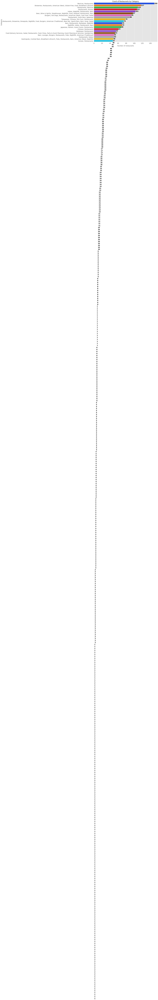

In [13]:
# plot top cuisines
plt.style.use('ggplot')
plt.figure(figsize = (11,7))
sns.countplot(y = 'categories',data = yelp_businessdf, 
              order = top_20.index, palette = sns.color_palette("bright", len(top_20)))
plt.xlabel('Number of restaurants', fontsize = 14, labelpad = 10)
plt.ylabel('Category', fontsize = 14)
plt.title('Count of Restaurants by Category', fontsize = 15)
plt.tick_params(labelsize = 14)
for  i, v in enumerate(yelp_businessdf.categories.value_counts()):
    plt.text(v, i + 0.15, str(v), fontweight = 'bold', fontsize = 14)

## Overall Word Cloud

In [14]:
'''https://courses.cognitiveclass.ai/courses/course-v1:CognitiveClass+DV0101EN+v1/courseware/89227024130b43f684d95376901b65c8/e7c36d2c4c6840fe8b81b97147ea9c16/'''

i = nltk.corpus.stopwords.words('english')
j = list(string.punctuation)
stopwords = set(i).union(j).union(('restaurant', 'food', 'place', 'thiswas','thisis','theres','there', 'got', 'one', 'wemt', 'came'))

In [15]:
def preprocess(x):
    x = re.sub('[^a-z\s]', '', x.lower())                  
    x = [w for w in x.split() if w not in set(stopwords)]  
    return ' '.join(x)

<>:2: DeprecationWarning:

invalid escape sequence \s

<>:2: DeprecationWarning:

invalid escape sequence \s

<>:2: DeprecationWarning:

invalid escape sequence \s

<ipython-input-15-432fa9fac335>:2: DeprecationWarning:

invalid escape sequence \s



In [16]:
biz_cnt = pd.DataFrame(yelp_businessdf['name'].value_counts()[:50])
yelp_top_reviewd_biz = yelp_businessdf.loc[yelp_businessdf['name'].isin(biz_cnt.index)]

In [17]:
yelp_top_reviewd_biz['text'] = yelp_top_reviewd_biz.text.astype(str)

In [18]:
yelp_top_reviewd_biz['text_processed'] = yelp_top_reviewd_biz['text'].apply(preprocess)

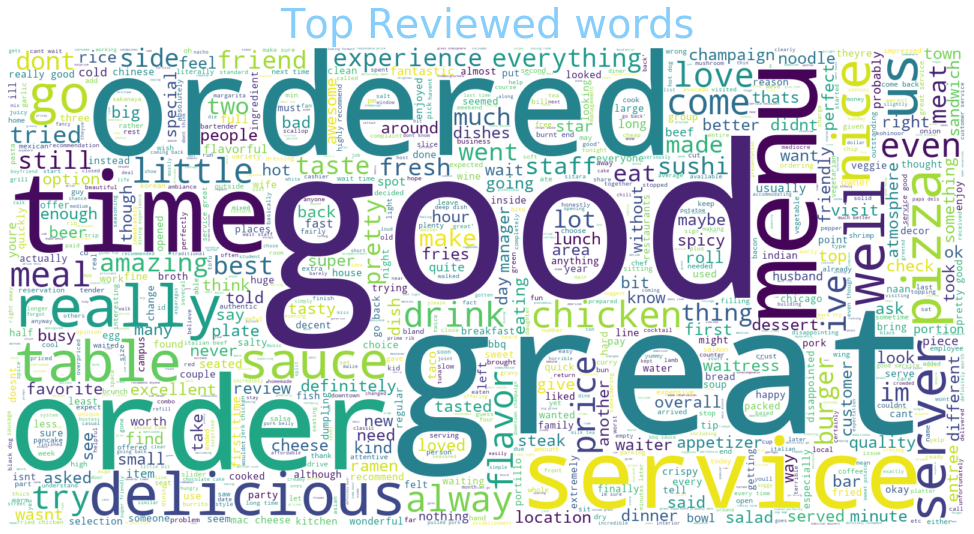

In [19]:
wordcloud = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud.generate(str(set(yelp_top_reviewd_biz['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Top Reviewed words", fontsize = 40, color = 'lightskyblue')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## American Word Cloud 

In [20]:
american_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("American")]
american_restaurants = american_restaurants[['business_id', 'name', 'text']]
american_restaurants.head()
print(american_restaurants.count())

business_id    1294
name           1294
text           1259
dtype: int64


In [21]:
american_restaurants['text'] = american_restaurants['text'].astype(str)
american_restaurants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1294 entries, 6827 to 1277470
Data columns (total 3 columns):
business_id    1294 non-null object
name           1294 non-null object
text           1294 non-null object
dtypes: object(3)
memory usage: 40.4+ KB


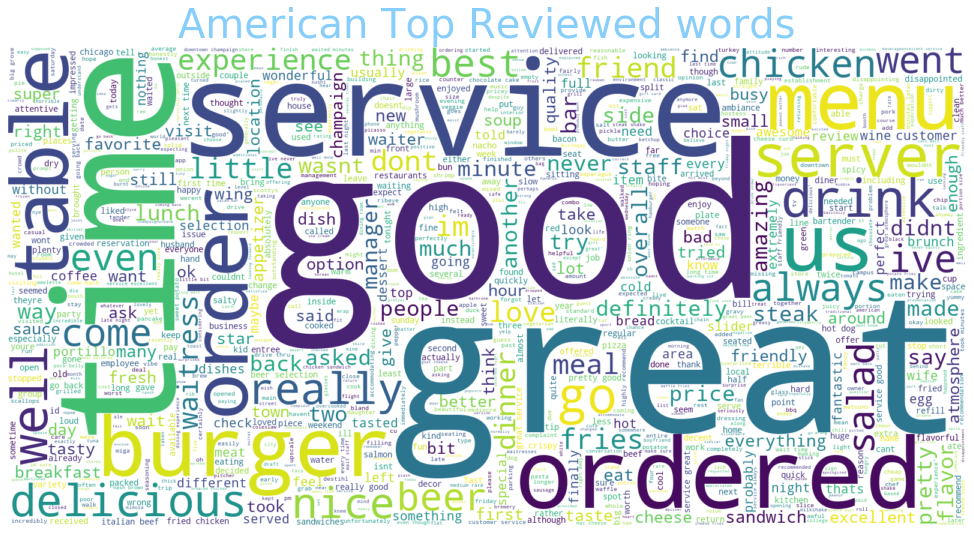

In [22]:
biz_cnt1 = pd.DataFrame(american_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz1 = american_restaurants.loc[american_restaurants['name'].isin(biz_cnt1.index)]
yelp_top_reviewd_biz1['text_processed'] = american_restaurants['text'].apply(preprocess)
wordcloud1 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud1.generate(str(set(yelp_top_reviewd_biz1['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("American Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud1, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Burger Word Cloud

In [23]:
burger_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Burger")]
burger_restaurants = burger_restaurants[['business_id', 'name', 'text']]
burger_restaurants.head()
print(burger_restaurants.count())
burger_restaurants['text'] = burger_restaurants['text'].astype(str)

business_id    576
name           576
text           559
dtype: int64


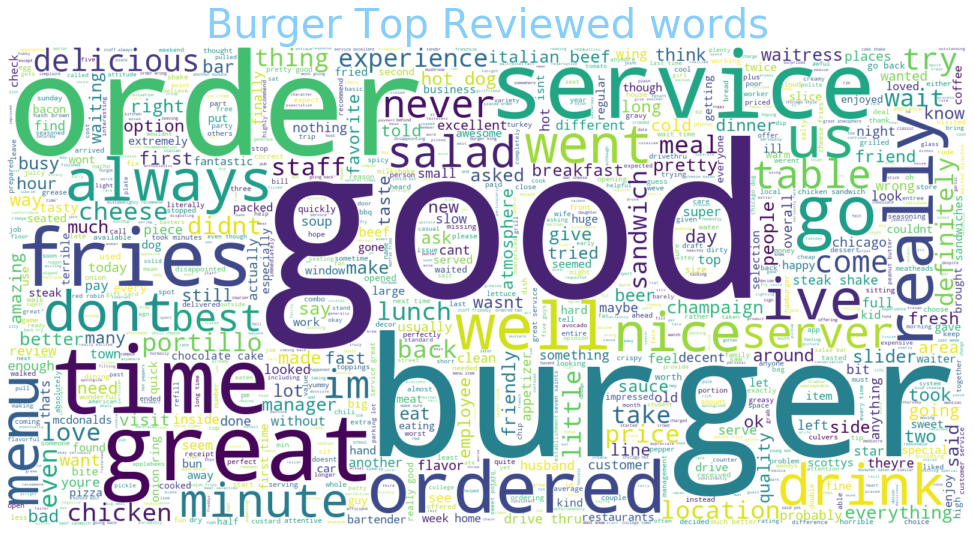

In [24]:
biz_cnt2 = pd.DataFrame(burger_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz2 = burger_restaurants.loc[burger_restaurants['name'].isin(biz_cnt2.index)]
yelp_top_reviewd_biz2['text_processed'] = burger_restaurants['text'].apply(preprocess)
wordcloud2 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud2.generate(str(set(yelp_top_reviewd_biz2['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Burger Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud2, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Mexican Word Cloud

In [25]:
mexican_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Mexican")]
mexican_restaurants = mexican_restaurants[['business_id', 'name', 'text']]
mexican_restaurants.head()
print(mexican_restaurants.count())
mexican_restaurants['text'] = mexican_restaurants['text'].astype(str)

business_id    478
name           478
text           450
dtype: int64


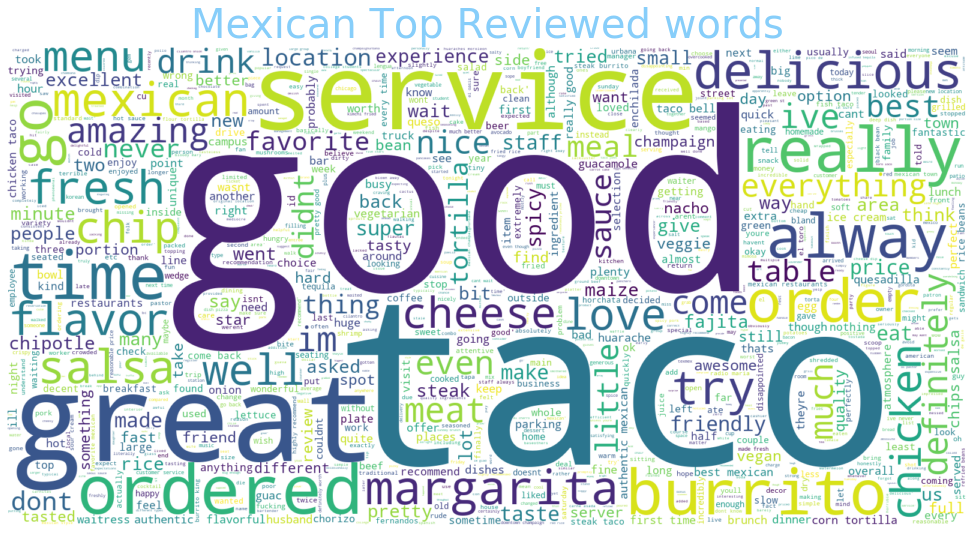

In [26]:
biz_cnt3 = pd.DataFrame(mexican_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz3 = mexican_restaurants.loc[mexican_restaurants['name'].isin(biz_cnt3.index)]
yelp_top_reviewd_biz3['text_processed'] = mexican_restaurants['text'].apply(preprocess)
wordcloud3 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud3.generate(str(set(yelp_top_reviewd_biz3['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Mexican Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud3, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Chinese Word Cloud

In [27]:
chinese_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Chinese")]
chinese_restaurants = chinese_restaurants[['business_id', 'name', 'text']]
chinese_restaurants.head()
print(chinese_restaurants.count())
chinese_restaurants['text'] = chinese_restaurants['text'].astype(str)

business_id    408
name           408
text           395
dtype: int64


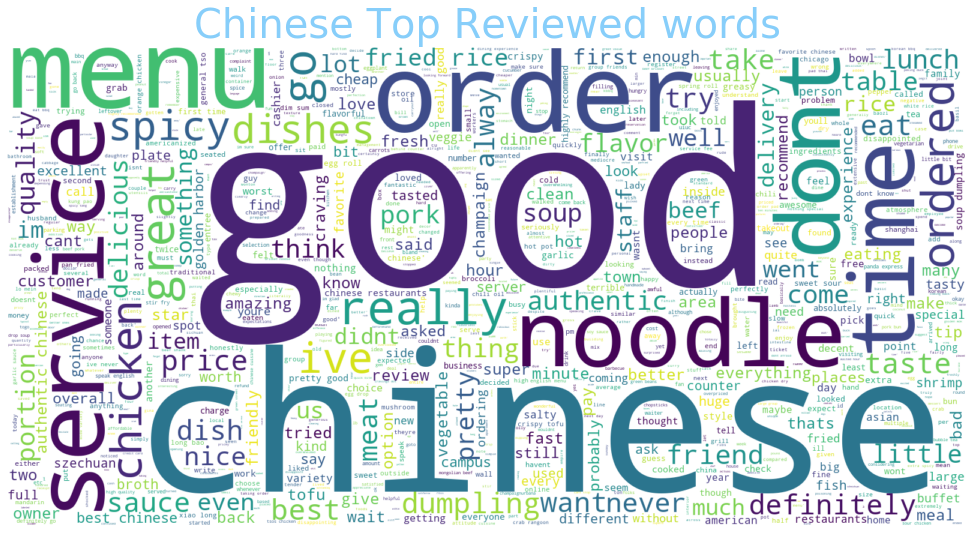

In [28]:
biz_cnt4 = pd.DataFrame(chinese_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz4 = chinese_restaurants.loc[chinese_restaurants['name'].isin(biz_cnt4.index)]
yelp_top_reviewd_biz4['text_processed'] = chinese_restaurants['text'].apply(preprocess)
wordcloud4 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud4.generate(str(set(yelp_top_reviewd_biz4['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Chinese Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud4, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Barbeque Word Cloud

In [29]:
bbq_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Barbeque")]
bbq_restaurants = bbq_restaurants[['business_id', 'name', 'text']]
bbq_restaurants.head()
print(bbq_restaurants.count())
bbq_restaurants['text'] = bbq_restaurants['text'].astype(str)

business_id    322
name           322
text           312
dtype: int64


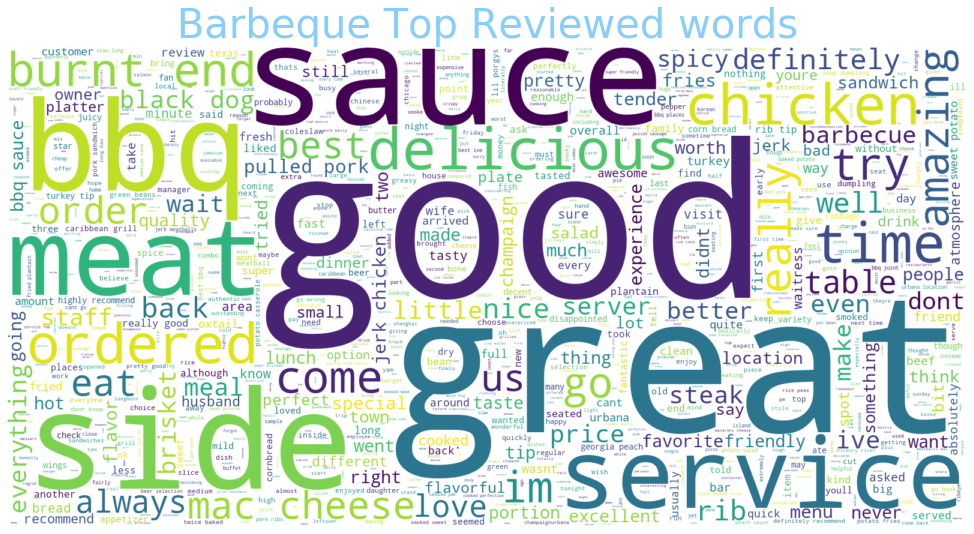

In [30]:
biz_cnt5 = pd.DataFrame(bbq_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz5 = bbq_restaurants.loc[bbq_restaurants['name'].isin(biz_cnt5.index)]
yelp_top_reviewd_biz5['text_processed'] = bbq_restaurants['text'].apply(preprocess)
wordcloud5 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud5.generate(str(set(yelp_top_reviewd_biz5['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Barbeque Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud5, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Korean Word Cloud

In [31]:
korean_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Korean")]
korean_restaurants = korean_restaurants[['business_id', 'name', 'text']]
korean_restaurants.head()
print(korean_restaurants.count())
korean_restaurants['text'] = korean_restaurants['text'].astype(str)

business_id    286
name           286
text           283
dtype: int64


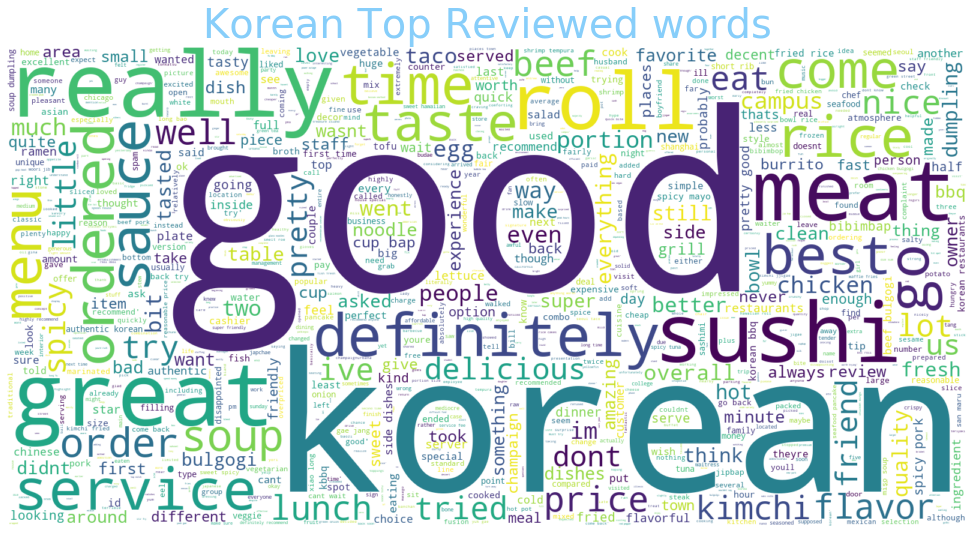

In [32]:
biz_cnt6 = pd.DataFrame(korean_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz6 = korean_restaurants.loc[korean_restaurants['name'].isin(biz_cnt6.index)]
yelp_top_reviewd_biz6['text_processed'] = korean_restaurants['text'].apply(preprocess)
wordcloud6 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud6.generate(str(set(yelp_top_reviewd_biz6['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Korean Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud6, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Italian Word Cloud

In [33]:
italian_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Italian")]
italian_restaurants = italian_restaurants[['business_id', 'name', 'text']]
italian_restaurants.head()
print(italian_restaurants.count())
italian_restaurants['text'] = italian_restaurants['text'].astype(str)

business_id    249
name           249
text           234
dtype: int64


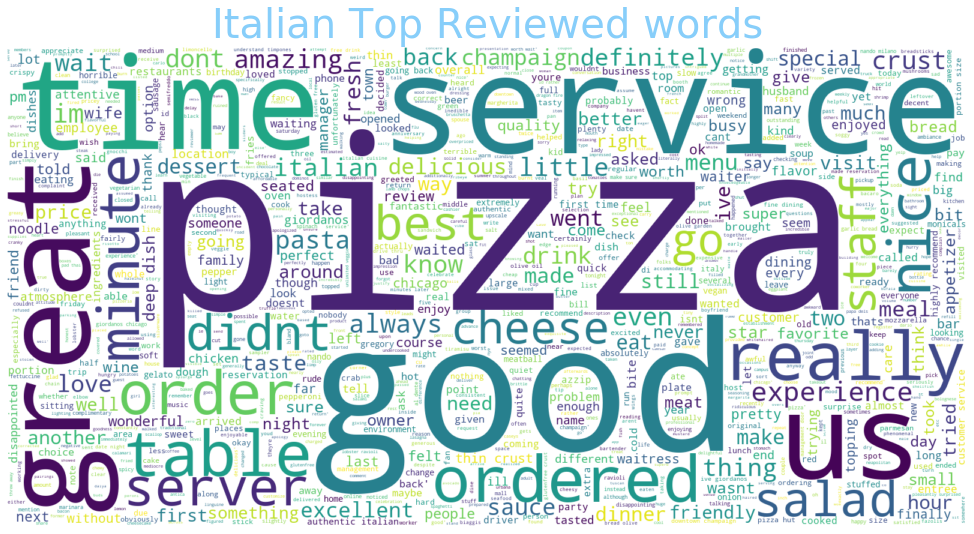

In [34]:
biz_cnt7 = pd.DataFrame(italian_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz7 = italian_restaurants.loc[italian_restaurants['name'].isin(biz_cnt7.index)]
yelp_top_reviewd_biz7['text_processed'] = italian_restaurants['text'].apply(preprocess)
wordcloud7 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud7.generate(str(set(yelp_top_reviewd_biz7['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Italian Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud7, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Indian Word Cloud

In [35]:
indian_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Indian")]
indian_restaurants = indian_restaurants[['business_id', 'name', 'text']]
indian_restaurants.head()
print(indian_restaurants.count())
indian_restaurants['text'] = indian_restaurants['text'].astype(str)

business_id    240
name           240
text           233
dtype: int64


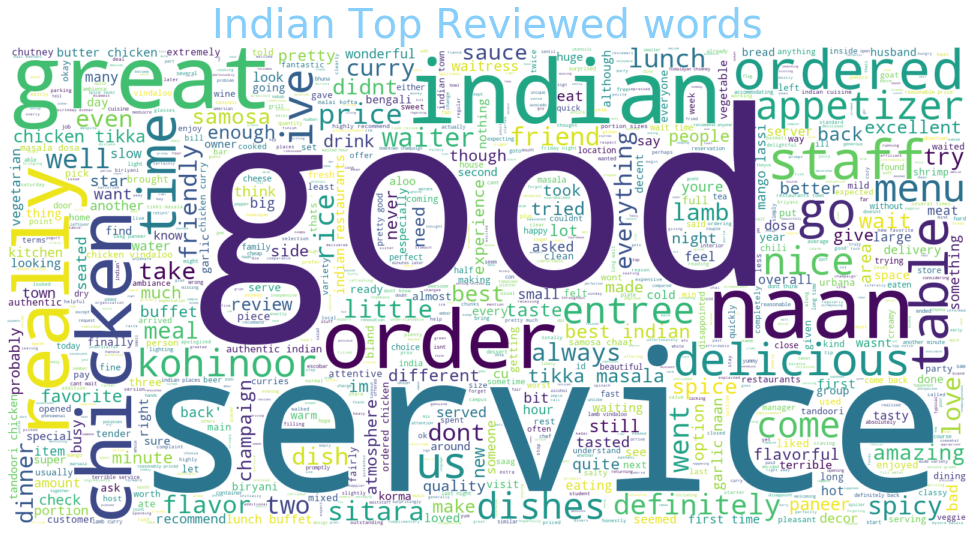

In [36]:
biz_cnt8 = pd.DataFrame(indian_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz8 = indian_restaurants.loc[indian_restaurants['name'].isin(biz_cnt8.index)]
yelp_top_reviewd_biz8['text_processed'] = indian_restaurants['text'].apply(preprocess)
wordcloud8 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud8.generate(str(set(yelp_top_reviewd_biz8['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Indian Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud8, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Steakhouse Word Cloud

In [37]:
steak_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Steakhouse")]
steak_restaurants = steak_restaurants[['business_id', 'name', 'text']]
steak_restaurants.head()
print(steak_restaurants.count())
steak_restaurants['text'] = steak_restaurants['text'].astype(str)

business_id    214
name           214
text           209
dtype: int64


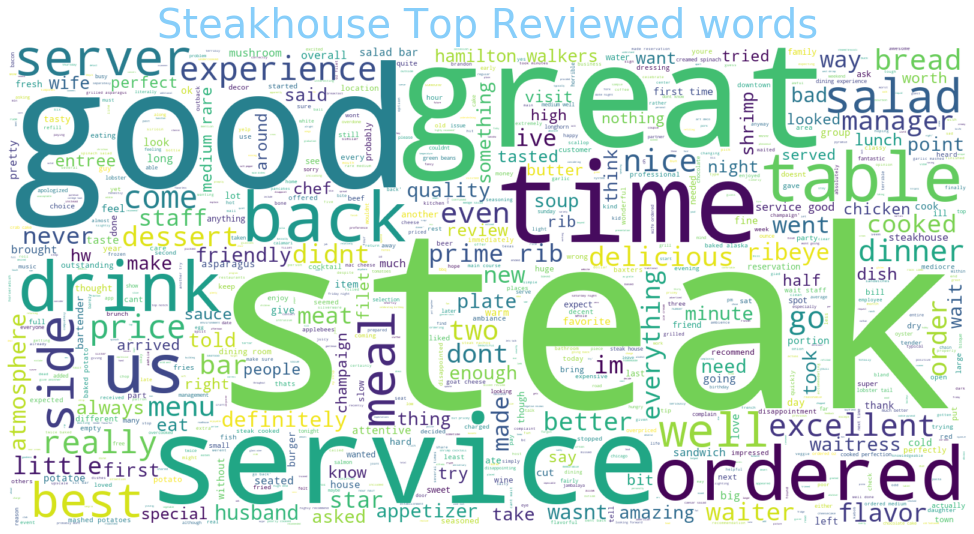

In [38]:
biz_cnt9 = pd.DataFrame(steak_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz9 = steak_restaurants.loc[steak_restaurants['name'].isin(biz_cnt9.index)]
yelp_top_reviewd_biz9['text_processed'] = steak_restaurants['text'].apply(preprocess)
wordcloud9 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud9.generate(str(set(yelp_top_reviewd_biz9['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Steakhouse Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud9, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Seafood Word Cloud

In [39]:
seafood_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Seafood")]
seafood_restaurants = seafood_restaurants[['business_id', 'name', 'text']]
seafood_restaurants.head()
print(seafood_restaurants.count())
seafood_restaurants['text'] = seafood_restaurants['text'].astype(str)

business_id    181
name           181
text           176
dtype: int64


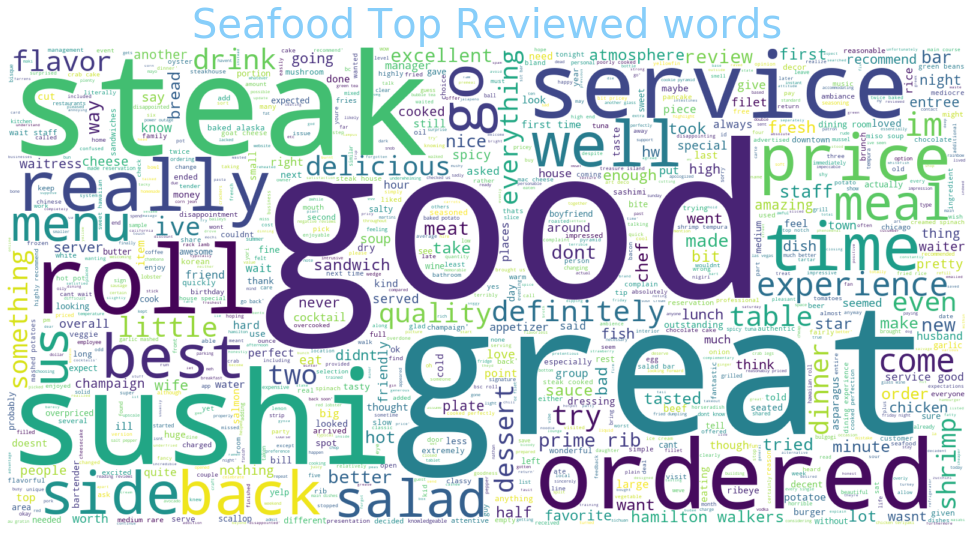

In [40]:
biz_cnt10 = pd.DataFrame(seafood_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz10 = seafood_restaurants.loc[seafood_restaurants['name'].isin(biz_cnt10.index)]
yelp_top_reviewd_biz10['text_processed'] = seafood_restaurants['text'].apply(preprocess)
wordcloud10 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud10.generate(str(set(yelp_top_reviewd_biz10['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Seafood Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud10, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

## Thai Word Cloud

In [41]:
thai_restaurants = yelp_businessdf[yelp_businessdf['categories'].str.contains("Thai")]
thai_restaurants = thai_restaurants[['business_id', 'name', 'text']]
thai_restaurants.head()
print(thai_restaurants.count())
thai_restaurants['text'] = thai_restaurants['text'].astype(str)

business_id    171
name           171
text           166
dtype: int64


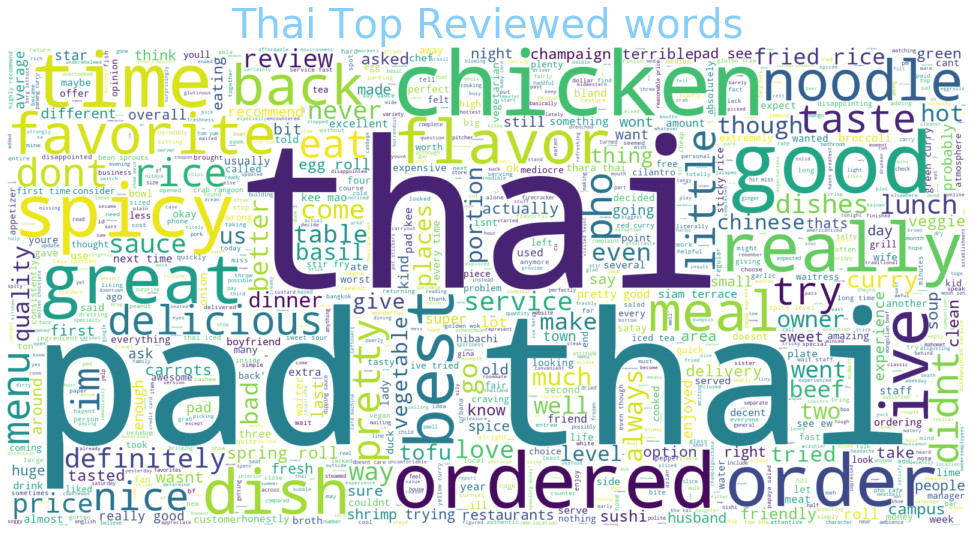

In [42]:
biz_cnt11 = pd.DataFrame(thai_restaurants['name'].value_counts()[:50])
yelp_top_reviewd_biz11 = thai_restaurants.loc[thai_restaurants['name'].isin(biz_cnt11.index)]
yelp_top_reviewd_biz11['text_processed'] = thai_restaurants['text'].apply(preprocess)
wordcloud11 = WordCloud(width = 1600, height = 800, random_state = 1, max_words = 1000, background_color = 'white',)
wordcloud11.generate(str(set(yelp_top_reviewd_biz11['text_processed'])))
plt.figure(figsize = (20,10))
plt.title("Thai Top Reviewed words", fontsize = 40,color = 'lightskyblue')
plt.imshow(wordcloud11, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad = 10)
plt.show()

# Topic Modeling

In [43]:
'''https://www.machinelearningplus.com/nlp/topic-modeling-gensim-python/'''
topic_text = yelp_top_reviewd_biz[['text_processed']]
topic_text.head()

,text_processed
15387,enjoyed lot decent fast sushi liked informal e...
15388,delicious poor customer service time go wait m...
15389,pleasantly surprised location much different l...
15390,love dollar sushi really wish options however ...
15391,good fast sushi go youre champaign university ...


In [44]:
topics = topic_text.text_processed
topics.head()

15387    enjoyed lot decent fast sushi liked informal e...
15388    delicious poor customer service time go wait m...
15389    pleasantly surprised location much different l...
15390    love dollar sushi really wish options however ...
15391    good fast sushi go youre champaign university ...
Name: text_processed, dtype: object

In [45]:
yelp_data = topics.values.tolist()
yelp_data = [re.sub('\s+', ' ', sent) for sent in yelp_data]
yelp_data = [re.sub("\'", "", sent) for sent in yelp_data]
pprint(yelp_data[:1])

['enjoyed lot decent fast sushi liked informal environment price quick meal '
 'wanted sampler two rolls try bunch different ones come try others']


<>:2: DeprecationWarning:

invalid escape sequence \s

<>:2: DeprecationWarning:

invalid escape sequence \s

<>:2: DeprecationWarning:

invalid escape sequence \s

<ipython-input-45-2f8ef4cdf29a>:2: DeprecationWarning:

invalid escape sequence \s



In [46]:
def sent_to_words(sentences):
    for sentence in sentences:
        yield(gensim.utils.simple_preprocess(str(sentence), deacc = True))  
data_words = list(sent_to_words(yelp_data))
print(data_words[:1])

[['enjoyed', 'lot', 'decent', 'fast', 'sushi', 'liked', 'informal', 'environment', 'price', 'quick', 'meal', 'wanted', 'sampler', 'two', 'rolls', 'try', 'bunch', 'different', 'ones', 'come', 'try', 'others']]


In [47]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append(" ".join([token.lemma_ if token.lemma_ not in ['-PRON-'] else '' for token in doc if token.pos_ in allowed_postags]))
    return texts_out
nlp = spacy.load('en', disable = ['parser', 'ner'])
data_lemmatized = lemmatization(data_words, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])
print(data_lemmatized[:2])

['enjoy lot decent fast like informal environment price quick meal want roll try bunch different one come try other', 'delicious poor customer service time go wait min takeout even be busy whenever check order always drop ticket will make right manager dismissive express repeat concern unfortunately be unwilling return']


In [48]:
vectorizer = CountVectorizer(analyzer = 'word',       
                             min_df = 10,                        
                             stop_words = 'english',             
                             lowercase = True,                   
                             token_pattern = '[a-zA-Z0-9]{3,}',  
                            )
data_vectorized = vectorizer.fit_transform(data_lemmatized)

In [50]:
# LDA Model
lda_model = LatentDirichletAllocation(n_components = 20,              
                                      max_iter = 10,               
                                      learning_method = 'online',   
                                      random_state = 100,          
                                      batch_size = 128,           
                                      evaluate_every = -1,       
                                      n_jobs = -1,              
                                     )
lda_output = lda_model.fit_transform(data_vectorized)
print(lda_model)  

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=20, n_jobs=-1,
                          perp_tol=0.1, random_state=100, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)


In [51]:
LatentDirichletAllocation(batch_size = 128, doc_topic_prior = None,
             evaluate_every = -1, learning_decay = 0.7,
             learning_method = 'online', learning_offset = 10.0,
             max_doc_update_iter = 100, max_iter = 10, mean_change_tol = 0.001,
             n_components = 20, n_jobs = -1, perp_tol = 0.1,
             random_state = 100, topic_word_prior = None,
             total_samples = 1000000.0, verbose = 0)

LatentDirichletAllocation(batch_size=128, doc_topic_prior=None,
                          evaluate_every=-1, learning_decay=0.7,
                          learning_method='online', learning_offset=10.0,
                          max_doc_update_iter=100, max_iter=10,
                          mean_change_tol=0.001, n_components=20, n_jobs=-1,
                          perp_tol=0.1, random_state=100, topic_word_prior=None,
                          total_samples=1000000.0, verbose=0)

In [52]:
# Log Likelyhood
print(lda_model.score(data_vectorized))
# Perplexity
print(lda_model.perplexity(data_vectorized))
pprint(lda_model.get_params())

-435943.58095071476
682.6646999607935
{'batch_size': 128,
 'doc_topic_prior': None,
 'evaluate_every': -1,
 'learning_decay': 0.7,
 'learning_method': 'online',
 'learning_offset': 10.0,
 'max_doc_update_iter': 100,
 'max_iter': 10,
 'mean_change_tol': 0.001,
 'n_components': 20,
 'n_jobs': -1,
 'perp_tol': 0.1,
 'random_state': 100,
 'topic_word_prior': None,
 'total_samples': 1000000.0,
 'verbose': 0}


In [53]:
search_params = {'n_components': [10, 15, 20, 25, 30], 'learning_decay': [.5, .7, .9]}
lda = LatentDirichletAllocation()
model = GridSearchCV(lda, param_grid = search_params)
model.fit(data_vectorized)

GridSearchCV(cv='warn', error_score='raise-deprecating',
             estimator=LatentDirichletAllocation(batch_size=128,
                                                 doc_topic_prior=None,
                                                 evaluate_every=-1,
                                                 learning_decay=0.7,
                                                 learning_method='batch',
                                                 learning_offset=10.0,
                                                 max_doc_update_iter=100,
                                                 max_iter=10,
                                                 mean_change_tol=0.001,
                                                 n_components=10, n_jobs=None,
                                                 perp_tol=0.1,
                                                 random_state=None,
                                                 topic_word_prior=None,
                                   

In [54]:
GridSearchCV(cv = None, error_score = 'raise',
       estimator = LatentDirichletAllocation(batch_size = 128, doc_topic_prior = None,
             evaluate_every = -1, learning_decay = 0.7, learning_method = None,
             learning_offset = 10.0, max_doc_update_iter = 100, max_iter = 10,
             mean_change_tol = 0.001, n_components = 20, n_jobs = 1,
             perp_tol = 0.1, random_state = None,
             topic_word_prior = None, total_samples = 1000000.0, verbose = 0),
       param_grid = {'n_components': [10, 15, 20, 25, 30], 'learning_decay': [0.5, 0.7, 0.9]},
       pre_dispatch ='2*n_jobs', refit = True, return_train_score = 'warn',
       scoring = None, verbose = 0)

GridSearchCV(cv=None, error_score='raise',
             estimator=LatentDirichletAllocation(batch_size=128,
                                                 doc_topic_prior=None,
                                                 evaluate_every=-1,
                                                 learning_decay=0.7,
                                                 learning_method=None,
                                                 learning_offset=10.0,
                                                 max_doc_update_iter=100,
                                                 max_iter=10,
                                                 mean_change_tol=0.001,
                                                 n_components=20, n_jobs=1,
                                                 perp_tol=0.1,
                                                 random_state=None,
                                                 topic_word_prior=None,
                                                 total_

In [55]:
# Best Model
best_lda_model = model.best_estimator_
print(model.best_params_)
# Log Likelihood 
print(model.best_score_)
# Perplexity
print(best_lda_model.perplexity(data_vectorized))

{'learning_decay': 0.9, 'n_components': 10}
-156882.45039381745
607.8925203060691


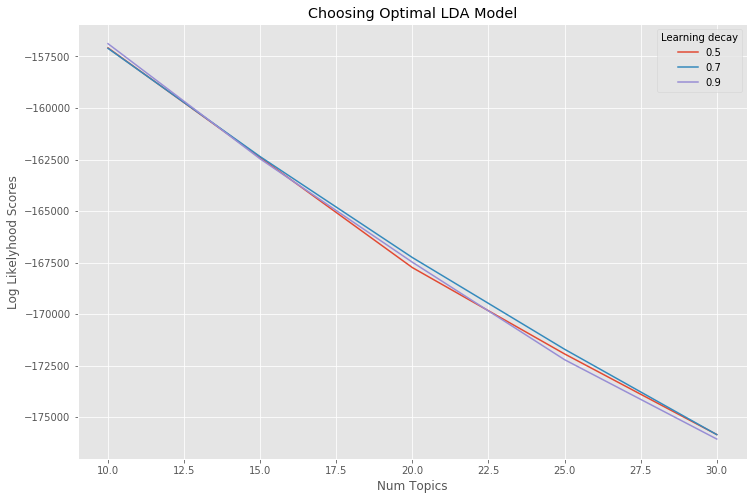

In [56]:
# Graph Log Likelyhoods
n_topics = [10, 15, 20, 25, 30]
log_likelyhoods_5 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.5]
log_likelyhoods_7 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.7]
log_likelyhoods_9 = [round(model.cv_results_['mean_test_score'][index]) for index, gscore in enumerate(model.cv_results_['params']) if gscore['learning_decay']==0.9]
plt.figure(figsize=(12, 8))
plt.plot(n_topics, log_likelyhoods_5, label='0.5')
plt.plot(n_topics, log_likelyhoods_7, label='0.7')
plt.plot(n_topics, log_likelyhoods_9, label='0.9')
plt.title("Choosing Optimal LDA Model")
plt.xlabel("Num Topics")
plt.ylabel("Log Likelyhood Scores")
plt.legend(title='Learning decay', loc='best')
plt.show()

# Sentiment & Correlation

In [61]:
columns = ['city', 'state', 'postal_code', 'is_open', 'categories', 'date_x', 'user_id', 'date_y', 'text']
df = pd.DataFrame(yelp_top_reviewd_biz.drop(columns,axis = 1,inplace = False))
df.head()

,business_id,name,review_count,attributes,review_id,stars,useful,funny,cool,text_processed
15387,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",UeUXC18z0-X_Qlu7vRD8ug,4.0,0.0,0.0,0.0,enjoyed lot decent fast sushi liked informal e...
15388,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",YtVQrVR32MCqyf8WqCquRg,2.0,1.0,0.0,0.0,delicious poor customer service time go wait m...
15389,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",vHqbD6uCwX-o1zL0umWZKw,4.0,0.0,0.0,0.0,pleasantly surprised location much different l...
15390,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",ot6AmjNXfSzjXUE42-tPXg,4.0,0.0,0.0,0.0,love dollar sushi really wish options however ...
15391,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",4-fYKZvaf5YP75NsS_MfXg,4.0,0.0,0.0,0.0,good fast sushi go youre champaign university ...


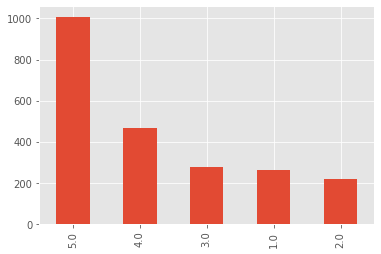

In [62]:
# Stars by review count
df['stars'].value_counts().plot(kind = 'bar')

In [63]:
# Sentiment polarity and subjectivity 
'''https://textblob.readthedocs.io/en/dev/quickstart.html'''
def senti(x):
    return TextBlob(x).sentiment  
df['senti_score'] = df['text_processed'].apply(senti)
print(df.senti_score.head())
print(df.senti_score.describe())

15387                    (0.3, 0.6444444444444445)
15388    (0.09714285714285713, 0.6871428571428572)
15389                   (0.26, 0.5616666666666668)
15390     (0.2942857142857143, 0.4164285714285714)
15391     (0.4666666666666666, 0.6000000000000001)
Name: senti_score, dtype: object
count           2238
unique          2189
top       (0.0, 0.0)
freq              15
Name: senti_score, dtype: object


In [64]:
analyser = SentimentIntensityAnalyzer()

In [65]:
def sentiment_analyzer_scores(sentence):
    score = analyser.polarity_scores(sentence)
    print("{:-<40} {}".format(sentence, str(score)))

In [66]:
df.head()

,business_id,name,review_count,attributes,review_id,stars,useful,funny,cool,text_processed,senti_score
15387,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",UeUXC18z0-X_Qlu7vRD8ug,4.0,0.0,0.0,0.0,enjoyed lot decent fast sushi liked informal e...,"(0.3, 0.6444444444444445)"
15388,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",YtVQrVR32MCqyf8WqCquRg,2.0,1.0,0.0,0.0,delicious poor customer service time go wait m...,"(0.09714285714285713, 0.6871428571428572)"
15389,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",vHqbD6uCwX-o1zL0umWZKw,4.0,0.0,0.0,0.0,pleasantly surprised location much different l...,"(0.26, 0.5616666666666668)"
15390,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",ot6AmjNXfSzjXUE42-tPXg,4.0,0.0,0.0,0.0,love dollar sushi really wish options however ...,"(0.2942857142857143, 0.4164285714285714)"
15391,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",4-fYKZvaf5YP75NsS_MfXg,4.0,0.0,0.0,0.0,good fast sushi go youre champaign university ...,"(0.4666666666666666, 0.6000000000000001)"


In [67]:
df['stars'] = yelp_top_reviewd_biz['stars']
df = df.replace([np.inf, -np.inf], np.nan)
df = df.dropna(subset = ['stars'])
df.stars = df.stars.astype(int)
df['sentiment'] = ""
if (df['stars'] < 3).all():
    df['sentiment'] = 0
else:
    df['sentiment'] = 1
df.head()

,business_id,name,review_count,attributes,review_id,stars,useful,funny,cool,text_processed,senti_score,sentiment
15387,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",UeUXC18z0-X_Qlu7vRD8ug,4,0.0,0.0,0.0,enjoyed lot decent fast sushi liked informal e...,"(0.3, 0.6444444444444445)",1
15388,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",YtVQrVR32MCqyf8WqCquRg,2,1.0,0.0,0.0,delicious poor customer service time go wait m...,"(0.09714285714285713, 0.6871428571428572)",1
15389,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",vHqbD6uCwX-o1zL0umWZKw,4,0.0,0.0,0.0,pleasantly surprised location much different l...,"(0.26, 0.5616666666666668)",1
15390,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",ot6AmjNXfSzjXUE42-tPXg,4,0.0,0.0,0.0,love dollar sushi really wish options however ...,"(0.2942857142857143, 0.4164285714285714)",1
15391,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",4-fYKZvaf5YP75NsS_MfXg,4,0.0,0.0,0.0,good fast sushi go youre champaign university ...,"(0.4666666666666666, 0.6000000000000001)",1


In [68]:
sentiment = SentimentIntensityAnalyzer()
def get_sentiment(text):
    sentiment =SentimentIntensityAnalyzer()
    compound = sentiment.polarity_scores(text)['compound']
    if compound > 0:
        return 1
    else:
        return 0
df['sentiment_vader'] = df['text_processed'].apply(get_sentiment)
df["subj"] = ""

In [69]:
df.head()

,business_id,name,review_count,attributes,review_id,stars,useful,funny,cool,text_processed,senti_score,sentiment,sentiment_vader,subj
15387,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",UeUXC18z0-X_Qlu7vRD8ug,4,0.0,0.0,0.0,enjoyed lot decent fast sushi liked informal e...,"(0.3, 0.6444444444444445)",1,1,
15388,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",YtVQrVR32MCqyf8WqCquRg,2,1.0,0.0,0.0,delicious poor customer service time go wait m...,"(0.09714285714285713, 0.6871428571428572)",1,0,
15389,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",vHqbD6uCwX-o1zL0umWZKw,4,0.0,0.0,0.0,pleasantly surprised location much different l...,"(0.26, 0.5616666666666668)",1,1,
15390,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",ot6AmjNXfSzjXUE42-tPXg,4,0.0,0.0,0.0,love dollar sushi really wish options however ...,"(0.2942857142857143, 0.4164285714285714)",1,1,
15391,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",4-fYKZvaf5YP75NsS_MfXg,4,0.0,0.0,0.0,good fast sushi go youre champaign university ...,"(0.4666666666666666, 0.6000000000000001)",1,1,


In [70]:
# seperate polarity and subjectivity scores
df[['senti_score', 'subj']] = pd.DataFrame(df['senti_score'].tolist(), index = df.index) 
df.head(20)

,business_id,name,review_count,attributes,review_id,stars,useful,funny,cool,text_processed,senti_score,sentiment,sentiment_vader,subj
15387,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",UeUXC18z0-X_Qlu7vRD8ug,4,0.0,0.0,0.0,enjoyed lot decent fast sushi liked informal e...,0.300000,1,1,0.644444
15388,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",YtVQrVR32MCqyf8WqCquRg,2,1.0,0.0,0.0,delicious poor customer service time go wait m...,0.097143,1,0,0.687143
15389,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",vHqbD6uCwX-o1zL0umWZKw,4,0.0,0.0,0.0,pleasantly surprised location much different l...,0.260000,1,1,0.561667
15390,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",ot6AmjNXfSzjXUE42-tPXg,4,0.0,0.0,0.0,love dollar sushi really wish options however ...,0.294286,1,1,0.416429
15391,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",4-fYKZvaf5YP75NsS_MfXg,4,0.0,0.0,0.0,good fast sushi go youre champaign university ...,0.466667,1,1,0.600000
15392,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",Eifn74ywlBJi2YCx9Lj_Zw,5,0.0,0.0,0.0,far favorite sushi campus urbana location perf...,0.322500,1,1,0.689167
15393,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",0gQd2lmbPKMUudURkjNUvg,4,1.0,0.0,2.0,enjoy dollar menu nice get sampler could try s...,0.407500,1,1,0.573333
15394,pCer-vIZM05p423MFmiSng,Kofusion,46,"{'RestaurantsAttire': ""'casual'"", 'Restaurants...",0hCHT-6zVqcD1bYlTB_XaQ,2,0.0,0.0,0.0,maybe due summer less satisfied lunch meal con...,0.021944,1,1,0.592500
22263,y2V42mxWvVoH4NvUT_n8eg,Red Robin Gourmet Burgers,67,"{'WiFi': ""'no'"", 'Alcohol': ""u'full_bar'"", 'Re...",bASIA-48zfcLiTTvrnCjRQ,1,0.0,0.0,0.0,go wa concept midwest task upholding high stan...,0.040000,1,0,0.510000
22264,y2V42mxWvVoH4NvUT_n8eg,Red Robin Gourmet Burgers,67,"{'WiFi': ""'no'"", 'Alcohol': ""u'full_bar'"", 'Re...",m_hMVvMW1bTAF15Kpl5wGA,3,2.0,0.0,0.0,new opened usually crowded always wait time bu...,0.228030,1,1,0.571212


In [71]:
# calculating correlation
df2 = df[['senti_score', 'stars']]
df2.head()

,senti_score,stars
15387,0.300000,4
15388,0.097143,2
15389,0.260000,4
15390,0.294286,4
15391,0.466667,4


In [72]:
# row correlation between sentiment score polarity and number of stars
print(df2.corr)
corr = df2['senti_score'].corr(df2['stars'])
# overall correlation between sentiment score polarity and number of stars
print(corr)

<bound method DataFrame.corr of          senti_score  stars
15387       0.300000      4
15388       0.097143      2
15389       0.260000      4
15390       0.294286      4
15391       0.466667      4
...              ...    ...
1250341     0.291667      4
1250342     0.040483      5
1250343    -0.028000      2
1250344     0.700000      3
1250345     0.425000      4

[2236 rows x 2 columns]>
0.5978823035001591


In [73]:
# # plot sentiment and stars
# corr_df.plot(x = 'stars', y = 'senti_score', kind = 'scatter', style = 'o', figsize = (10, 10))
# plt.show()

In [74]:
from numpy import cov
from scipy.stats import pearsonr
from scipy.stats import spearmanr

In [75]:
data1 = df.senti_score.astype(float)
data2 = df.stars.astype(float)
# covariance between sentiment score polarity and stars
print(cov(data1, data2))
# R^2 sentiment score polarity and stars
print(pearsonr(data1, data2))
# Spearman's rank correlation coefficient sentiment score polarity and stars
print(spearmanr(data1, data2))

[[0.05286745 0.19306643]
 [0.19306643 1.97239458]]
(0.5978823035001593, 7.45455365220701e-217)
SpearmanrResult(correlation=0.5801947694104911, pvalue=2.3313093072181037e-201)


In [76]:
# Correlation between just negative reviews sentiment score polarity and stars
# where negative reviews have 0, 1, or 2 stars
df3 = df[df['sentiment_vader'] == 0]
df3 = df3[['senti_score', 'stars']]
df3.head()
data3 = df3.senti_score.astype(float)
data4 = df3.stars.astype(float)
corr2 = df3['senti_score'].corr(df3['stars'])
# row wise
print(corr2)
# Covariance
print(cov(data3, data4))
# R^2
print(pearsonr(data3, data4))
# Spearman's
print(spearmanr(data3, data4))

0.39350309054598054
[[0.05364212 0.10377068]
 [0.10377068 1.2964243 ]]
(0.3935030905459806, 1.8863815681080928e-09)
SpearmanrResult(correlation=0.3557068246618527, pvalue=7.170630250434182e-08)


In [77]:
# Correlation between just positive reviews sentiment score polarity and stars
# where positive reviews have 3, 4, or 5 stars
df4 = df[df['sentiment_vader'] == 1]
df4 = df4[['senti_score', 'stars']]
df4.head()
data5 = df4.senti_score.astype(float)
data6 = df4.stars.astype(float)
corr3 = df4['senti_score'].corr(df4['stars'])
# row wise
print(corr3)
# covariance
print(cov(data5, data6))
# R^2
print(pearsonr(data5, data6))
# Spearman's
print(spearmanr(data5, data6))

0.4933083292120789
[[0.03989933 0.12264081]
 [0.12264081 1.54905749]]
(0.49330832921207846, 2.6278097511000018e-124)
SpearmanrResult(correlation=0.49569301412345546, pvalue=1.1224846660383541e-125)


In [78]:
# Correlationo for subjectivity sentiment score vs stars
df5 = df[['subj', 'stars']]
df5.head()
print(df5.corr)
corr5 = df5['subj'].corr(df5['stars'])
print(corr5)
data7 = df.subj.astype(float)
data8 = df.stars.astype(float)
# covariance
print(cov(data7, data8))
# R^2
print(pearsonr(data7, data8))
# Spearman's
print(spearmanr(data7, data8))

<bound method DataFrame.corr of              subj  stars
15387    0.644444      4
15388    0.687143      2
15389    0.561667      4
15390    0.416429      4
15391    0.600000      4
...           ...    ...
1250341  0.608333      4
1250342  0.756818      5
1250343  0.538000      2
1250344  0.600000      3
1250345  0.725000      4

[2236 rows x 2 columns]>
0.24515834169598416
[[0.01862573 0.04698943]
 [0.04698943 1.97239458]]
(0.24515834169598427, 5.831380084696999e-32)
SpearmanrResult(correlation=0.2505292895005883, pvalue=2.4013174683541658e-33)
